<a href="https://colab.research.google.com/github/lucazini03/IPCV/blob/main/lab_session_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Local Invariant Features and SIFT descriptors**
## Image Processing and Computer Vision - Lab Session No. 2


Contacts:

- Prof. Giuseppe Lisanti -> giuseppe.lisanti@unibo.it
- Prof. Samuele Salti -> samuele.salti@unibo.it
- Alex Costanzino -> alex.costanzino@unibo.it
- Francesco Ballerini -> francesco.ballerini4@unibo.it

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

!cp -r /content/drive/MyDrive/lab_session_2_images.zip ./
!unzip lab_session_2_images.zip

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Archive:  lab_session_2_images.zip
  inflating: bishop.jpg              
  inflating: box_in_scene.png        
  inflating: __MACOSX/._box_in_scene.png  
  inflating: box.png                 
  inflating: __MACOSX/._box.png      
  inflating: panorama_left_rgb.jpg   
  inflating: panorama_left.jpg       
  inflating: panorama_right_rgb.jpg  
  inflating: panorama_right.jpg      
  inflating: scene1.jpg              
  inflating: scene2.jpg              
  inflating: scene3.jpg              
  inflating: scene4.jpg              
  inflating: scene5.jpg              
  inflating: stregatto.jpg           


##  1. Correspondences
A great variety of computer vision problems can be dealt with by finding corresponding points between images.

**Corresponding points**: image points that are the projection of the same 3D position from different points of view.

Being projections, their appearances can vary greatly between one image and the other.

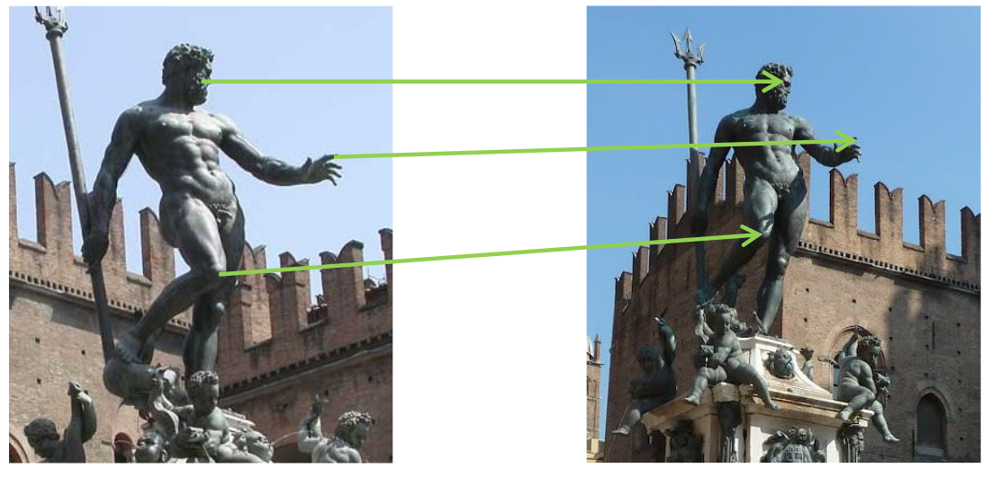

### 1.1 Examples of tasks that exploit correspondences

#### 1.1.1 SLAM

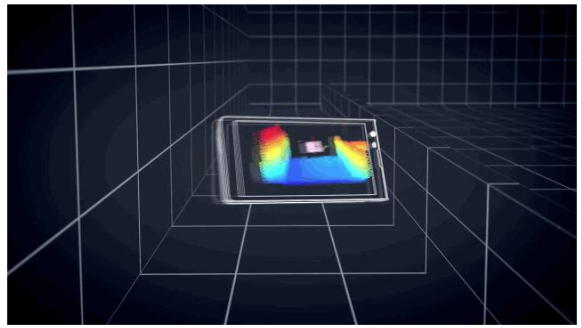

#### 1.1.2 Augmented Reality

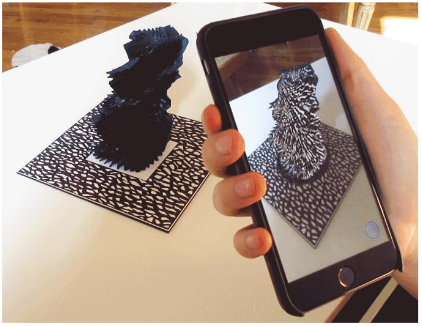



#### 1.1.3 3D Reconstruction
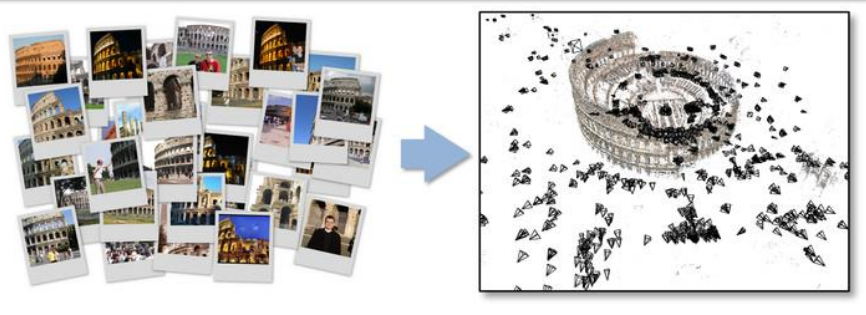


## 2. Object Detection

Object Detection consists in finding instances of objects in images (scenes) given one or more reference images depicting them (models).

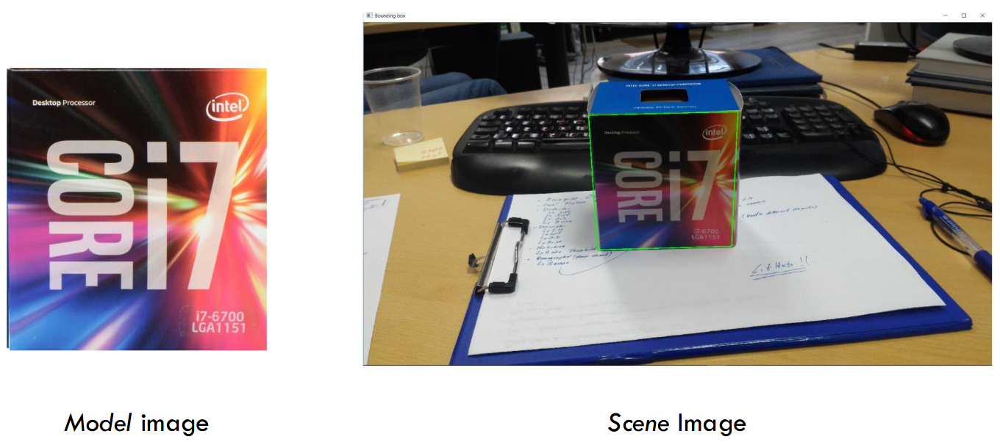

**What can go wrong? What should a good detection system be able to handle?**

* **Scale invariance**: objects may appear at any scale in the scene, not only at the same resolution used for the model images;
* **Rotation invariance**: objects may appear rotated or skewed in the scene;
* **Photometric invariance**: objects may appear in any light condition in the scene;
* **Occlusion**: portions of the objects may not be visible in the scene;
* **Perspective distortion**: objects may appear fairly different if viewed from different camera viewpoints.

### 2.1 Object Detection with CNNs

State of the art methods are based on deep learning, especially convolutional neural networks (i.e. CNNs).

**Pros**:
* Astonishing real time performance for the detection of complex and highly variable categories of objects (people, animals, vehicles, etc.).

**Cons**:
* Requires thousands of model images for each category of objects we want to recognize and a lot of time to train the algorithm.

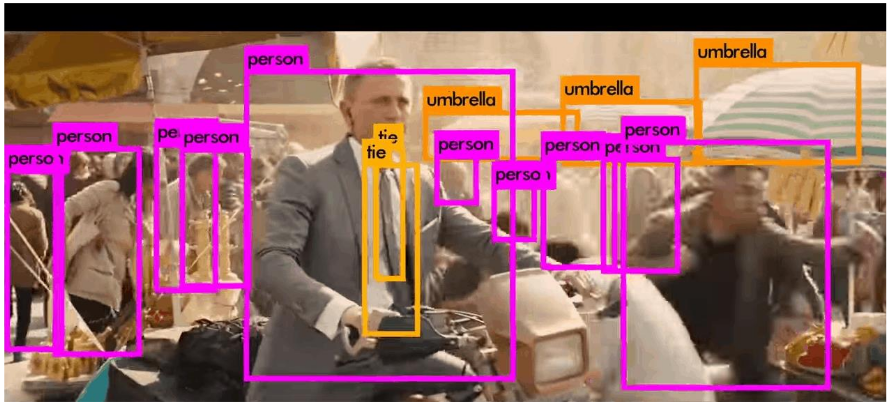

### 2.2 Object Detection with Local Invariant Features

Allows to successfully identify objects in the scene from a
single model image per object.

**Pros:**
* Quite effective for the detection of textured objects;
* Scale, rotation and photometrically invariant;
* Works well under partial occlusion;
* Only one model image per object required;
* Fully implementable with OpenCV in a few lines of code.

**Cons**:
* Suffers from changes in camera viewpoints;
* Can be slow when the number of objects to recognize increases;
* Does not work well with deformable objects or to detect categories of objects.

**Pipeline**:
1. **Detection**: identify salient repeatable points, namely **keypoints**, in model and scene images;
2. **Description**: create a unique description of each point, usually based on its local pixel neighborhood;
3. **Matching**: match points from scene and model according to a similarity function between the descriptors;
4. **Position estimation**: estimate the position of the object in the scene image given enough matching points.

## 3. Implementation of an Object Detection Pipeline with Local Invariant Features in OpenCV

Let us now try to implement an object detection pipeline using the SIFT detector and descriptor.

As usual, let us first import the needed Python libraries:

In [ ]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

Let us load a scene image:

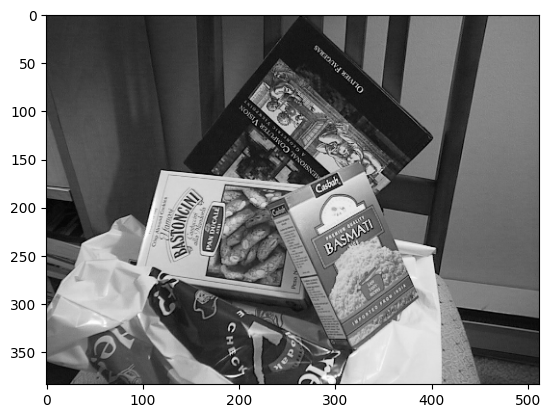

In [ ]:
img_scene = cv2.imread("box_in_scene.png", cv2.IMREAD_GRAYSCALE)
plt.imshow(img_scene, cmap="gray", vmin=0, vmax=255)
plt.show()

And a model image:

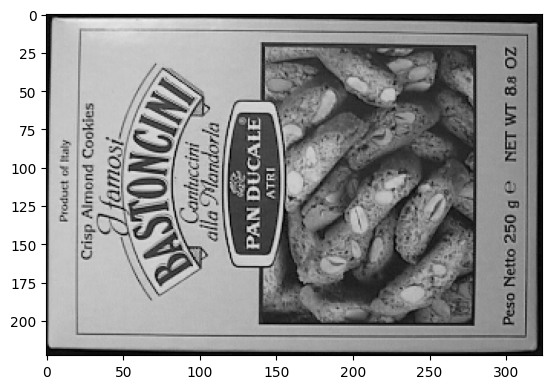

In [ ]:
img_model = cv2.imread("box.png", cv2.IMREAD_GRAYSCALE)
plt.imshow(img_model, cmap="gray", vmin=0, vmax=255)
plt.show()

### 3.1 Keypoint Detection

Common scheme:

1. Compute a saliency score for each pixel location based on the response of different mathematical operators;
2. Keep only the points that are local maxima;
3. For each keypoint estimate the scale at which it is salient (scale invariance) and the orientation (rotation invariance).   

Let us now find the keypoints based on the SIFT detector. We first initialize the SIFT detector object as follows:


In [ ]:
# Initiate SIFT detector
sift = cv2.SIFT_create()

Then, we need to find the keypoints in the model image. We will use the `detect` method of the SIFT detector object:

In [ ]:
# find the keypoints and descriptors with SIFT
kp_model = sift.detect(img_model)

We can print useful information about a keypoint as follows:

In [ ]:
# Number of keypoints
print(len(kp_model))

# Location of the keypoint
print(kp_model[4].pt)

# Scale
print(kp_model[4].size)

# Rotation
print(kp_model[4].angle)

604
(9.602896690368652, 118.08353424072266)
2.2116410732269287
216.16510009765625


We can also visualize the keypoints with the following function:

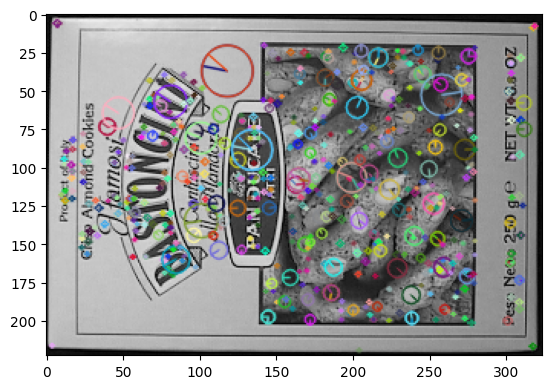

In [ ]:
# Visualize keypoints with drawKeypoints.
# Use flag DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS to show scale and orientation of keypoints.
img_visualization = cv2.drawKeypoints(img_model, kp_model, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(img_visualization)
plt.show()

Now, let us find and draw the keypoints for the scene image:

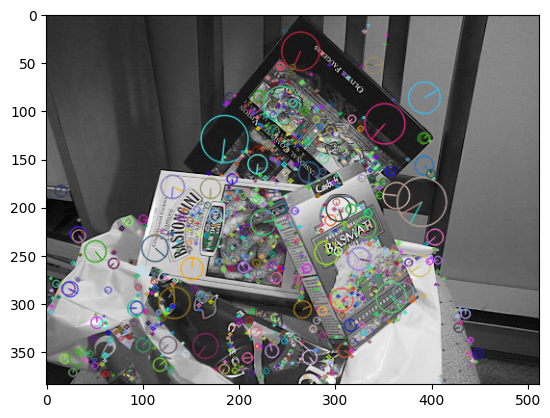

In [ ]:
kp_scene = sift.detect(img_scene)

img = cv2.drawKeypoints(img_scene, kp_scene, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(img)
plt.show()

### 3.2 Keypoints Description

For each keypoint, compute a unique description, usually based on the nearby pixels (descriptor support).

A good keypoint descriptor should be:
* Repeatable: the descriptions computed at homologous points should be as similar as possible;
* Distinctive: capture salient information about the keypoint despite various nuisances (e.g. light changes);
* Compact: minimize memory occupancy to allow efficient matching;
* Fast: it is usually applied to hundreds or thousands of keypoints in each image.

Different algorithms provide different descriptions, the common idea being to describe a keypoint using an array (histogram) of values that encodes the appearance of its local neighborhood. The size of the support depends on the scale associated with the keypoint (i.e. scale invariance); moreover, the descriptor is computed according to the orientation associated with the  keypoint (i.e rotation invariance).

The histogram used for the description can be made of:
* floats: more distinctive, high memory footprint;
* bits: less distinctive, small memory footprint (binary descriptors).

Some well known algorithms:
1. **SIFT**: 128 floats array (4.096 bytes for each descriptor);
2. **SURF**: 64 floats array (2.048 bytes for each descriptor);
3. **BRISK**:  512 bit array (64 bytes for each descriptor);
4. **ORB**: 256 bit array (32 bytes for each descriptor).

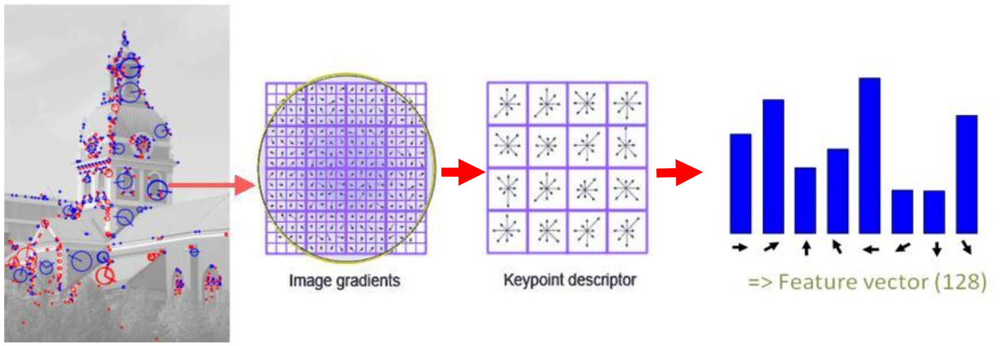

We will use the SIFT descriptor for this sample study. We can use the same SIFT detector object by calling the `compute` method:

In [ ]:
# Describing keypoints for model and scene images
kp_model, des_model = sift.compute(img_model, kp_model)
kp_scene, des_scene = sift.compute(img_scene, kp_scene)

For each keypoint, we got an array of 128 floats:

In [ ]:
print("Number of model descriptors: ", len(des_model))
print("Dimensionality of a SIFT descriptor: ", des_model[0].shape)
print("Descriptor type: ", des_model[0].dtype)

Number of model descriptors:  604
Dimensionality of a SIFT descriptor:  (128,)
Descriptor type:  float32


### 3.3 Feature Matching

Descriptors extracted from the scene are compared with those extracted from the models to find couples of similar descriptors.

Classic Nearest Neighbour (NN) Search problem: given a set of $N$ points $R=\{r_0,...,r_N\}$, a query point $q$ and a distance function $d$, find the point $r_\text{NN} \in R$ such that:

$d(q,r_\text{NN})<d(q,r_n)\quad\forall r_n \in R$

In our scenario, points are SIFT descriptors (i.e. 128-dimensional vectors) and the distance function is the Euclidean distance for floats or
the Hamming distance for bits.

**Naive idea (brute force matcher):** for each descriptor $q$ in the model image, compute $d(q,r_n)$ for all descriptors $r_n$ in the scene image to find the one that minimizes such distance. Too slow to be applied in most applications; it may sometimes be used with binary descriptors, where the distance function is a simple XOR between descriptors.

**Smarter idea (indexing techniques):** use efficient indexing techniques borrowed from the database management field to speed up the search, such as:
* Kd-tree (exact);
* BBF (approximated);
* LSH (for binary descriptor).

**Kd-tree** may be thought of as partitioning the search space into *bins*. During backtracking, the bins adjacent to the one containing the found leaf are examined.

However, the number of bins grows exponentially with the dimension of the space, so kd-tree does not work well for high-dimensional spaces.

**Approximate techniques** help speeding up the search.

For instance, we will use an approximate kd-tree algorithm from **FLANN** (Fast Library for Approximate Nearest Neighbors), included in OpenCV.

**FLANN** contains a collection of algorithms optimized for fast nearest neighbor search in large datasets and for high dimensional features.

In [ ]:
# Defining index for approximate kdtree algorithm
FLANN_INDEX_KDTREE = 1

# Defining parameters for algorithm
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)

# Defining search params.
# checks=50 specifies the number of times the trees in the index should be recursively traversed.
# Higher values give better precision, but also take more time.
search_params = dict(checks=50)

# Initializing matcher
flann = cv2.FlannBasedMatcher(index_params, search_params)

# Matching and finding the 2 closest elements for each model descriptor
matches = flann.knnMatch(des_model, des_scene, k=2)

### 3.4 Filtering False Matches in SIFT
To **filter out** false matches, Lowe proposed to use a distance ratio test.

The **distance ratio** between the two nearest matches of a given keypoint is computed. A match is considered good when this value is below a threshold.

Indeed, this ratio allows discriminating between **ambiguous matches** (i.e. those where the distance ratio is close to 1) and **well discriminated matches**.

The figure below from the SIFT paper illustrates the probability that a match is correct based on the distance ratio test.

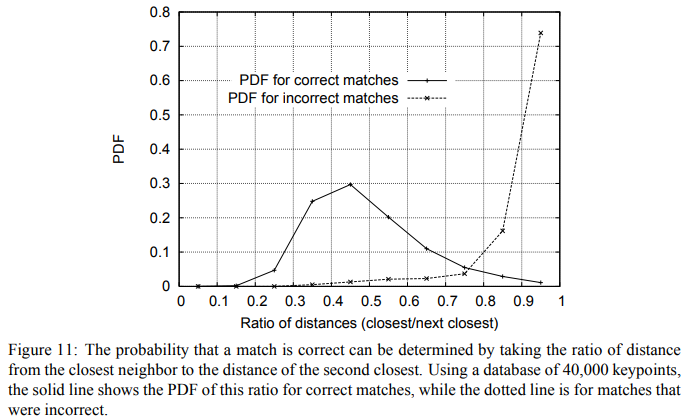

Therefore, we iterate along all matches while checking whether the distance ratio between the first and the second closest element is less than 0.7 (i.e. the chosen threshold):

In [ ]:
good = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good.append(m)

### 3.5 Position Estimation

**How can we find the position of the object in the scene?**

To find the position we have to compute, given the **correspondences**, a suitable transformation that brings points from the model reference system to the scene reference system.

**Homography**: a transformation that relates any two images of the same planar surface under the pinhole camera model. A homography is a $3x3$ matrix that transforms points expressed in homogeneous coordinates; it can be decomposed into a rotation, a translation and a perspective distortion.

Given corresponding couples of points $(m,s) \in R^2$ with $m \in C_m$ and $s \in C_s$, estimating a homography means solving a linear system:

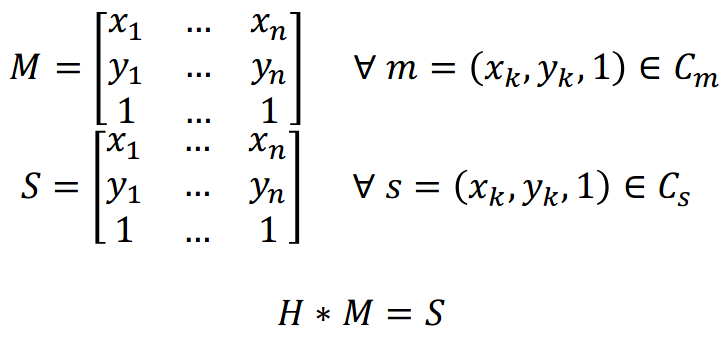

Usually, these systems are over-constrained problems with no exact solution; therefore, they are solved by minimizing the error with the least square solution.

**However, transforming the corners of the model image in the scene image reference system with a homography computed using the least square solution leads to imprecise results:**

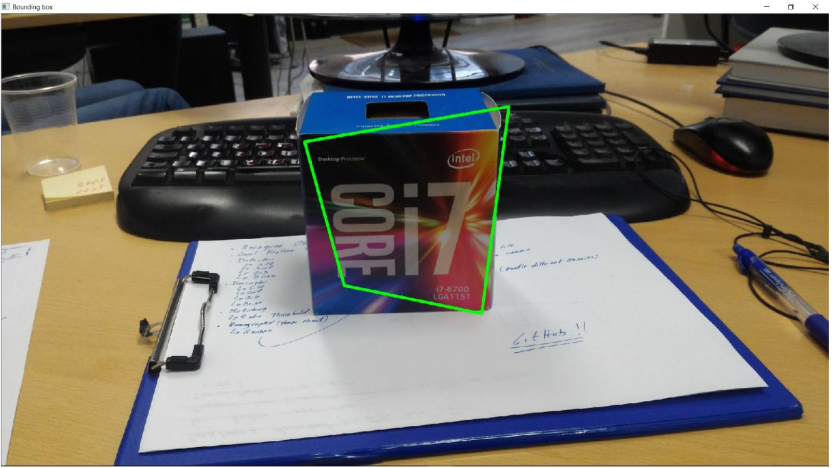

**PROBLEM: some of the matches are completely wrong and the estimated homography can be quite bad.**

We can use **Random Sample Consensus (RANSAC)**, an algorithm to fit a parametric model to noisy data. In our case, this means estimating a homography from good matches while identifying and discarding the wrong ones.

### RANSAC algorithm:
Given a set of observations $O=\{o_1,\dots,o_n\}$ and a parametric model $M$, repeat iteratively:
1. Pick a random (small) subset $I$ of $O$ called inlier set;
2. Fit a model $M_i$ according to the observations in $I$;
3. Test the other observations against $M_i$ and add to a new set $C$ (consensus set) the observations that fit $M_i$ according to a model-specific loss function;
4. If the consensus set is bigger than the one associated with the current best model $M_b$, go to step 5, otherwise return to step 1;
5. Re-compute $M_i$ according to the observations in $I \cup C$, then set $M_b=M_i$. Restart from step 1.

The procedure is repeated for a fixed amount of steps, at the end of which the best model is returned.

A simple example of RANSAC used to fit a line to a set of 2D points with Euclidean distance as loss function:
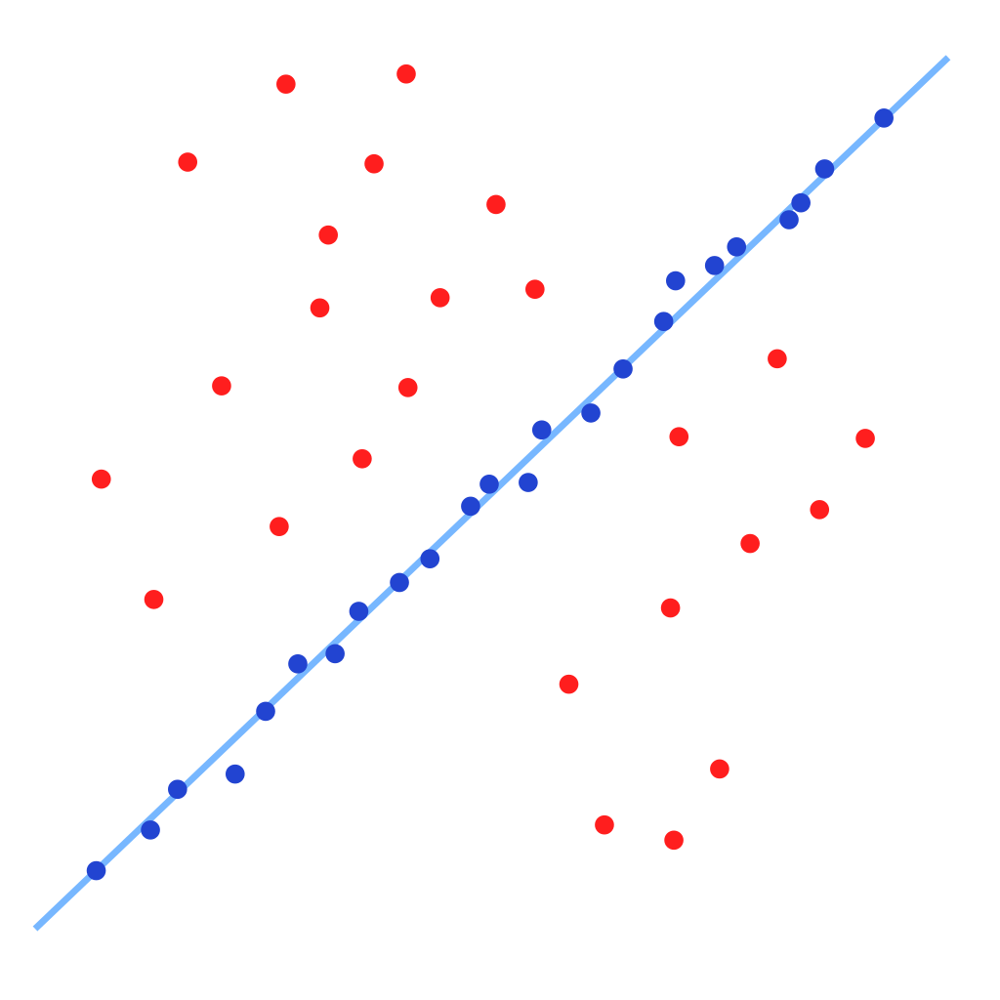

In our case, we use the homography as parametric model and the reprojection error as loss function.

If we compute a bounding box transforming the corners of the model image in the scene image reference system with a homography computed using RANSAC, we obtain the following result:

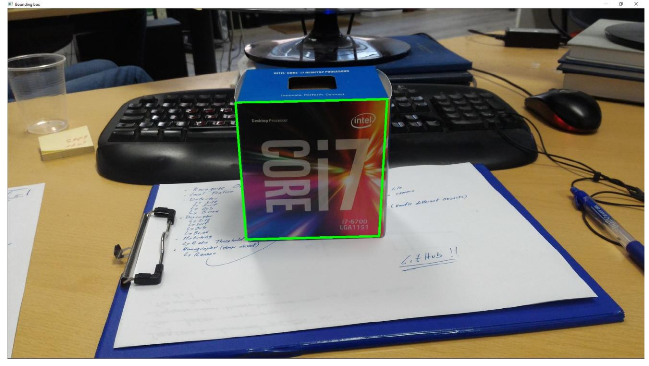


### 3.6 OpenCV Implementation

Given the set of good matches previously found, we can perform the following steps to find the position of the model object in the scene image:
* Set a condition stating that at least N matches (defined by `MIN_MATCH_COUNT`) have to be found in order for the object to be considered detected;
* If enough matches are found, extract the locations of matched keypoints in both images and build correspondence arrays;
* Use the correspondences to estimate a homography;
* Use the obtained 3x3 transformation matrix to transform the corners of the model image to corresponding points in the scene image.

In [ ]:
# Checking if enough matches are found
MIN_MATCH_COUNT = 10

if len(good) > MIN_MATCH_COUNT:
    # Building the correspondence arrays of good matches
    src_pts = np.float32([kp_model[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp_scene[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)
    # Using RANSAC to estimate a robust homography.
    # It returns the homography M and a mask for the discarded points.
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    # Mask of discarded point used in visualization
    matches_mask = mask.ravel().tolist()

    # Corners of the model image
    h, w = img_model.shape
    pts = np.float32([[0,0], [0,h-1], [w-1,h-1], [w-1,0]]).reshape(-1, 1, 2)

    # Projecting the corners into the scene image
    dst = cv2.perspectiveTransform(pts, M)

    # Drawing the bounding box
    img_train_p = cv2.polylines(img_scene,[np.int32(dst)], True, 255, 3, cv2.LINE_AA)

else:
    print(f"Not enough matches are found - {len(good)}/{MIN_MATCH_COUNT}")
    matches_mask = None

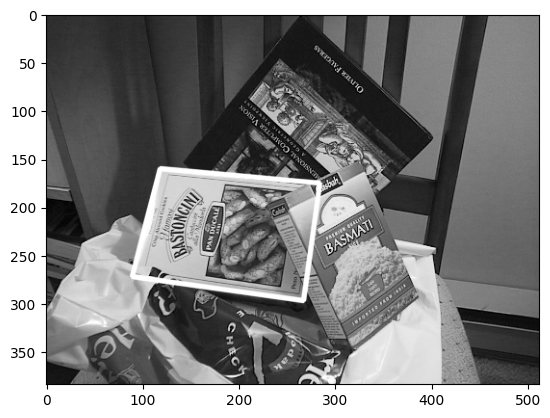

In [ ]:
plt.imshow(img_train_p, cmap="gray", vmin=0, vmax=255)
plt.show()

Finally, we can draw the matches as follows:

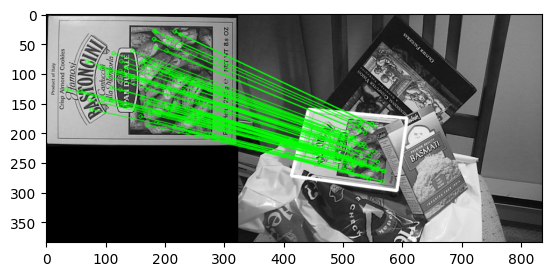

In [ ]:
# Drawing the matches
draw_params = dict(
    matchColor=(0, 255, 0),    # draw matches in green color
    singlePointColor=None,     # do not draw keypoints, only matching lines
    matchesMask=matches_mask,  # draw inliers only
    flags=2
)
img3 = cv2.drawMatches(img_model, kp_model, img_scene, kp_scene, good, None, **draw_params)
plt.imshow(img3, cmap="gray", vmin=0, vmax=0)
plt.show()

# Excercises

## Exercise 1: Image Search
Given a model image (`bishop.jpg`) and several scene images (`scene1.jpg`, `scene2.jpg`, `scene3.jpg`, `scene4.jpg` and `scene5.jpg`) implement an algorithm that identifies which scene images contain the model object.

Found query object in scene1.jpg: True


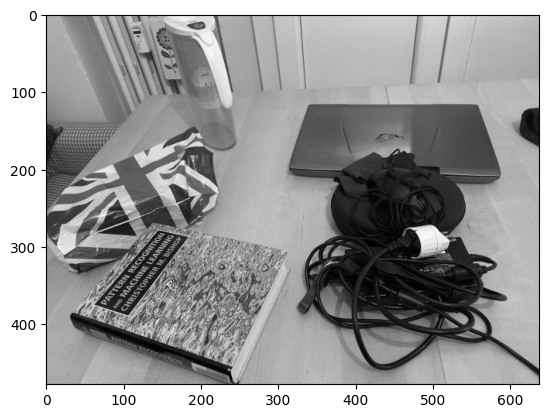

Found query object in scene2.jpg: True


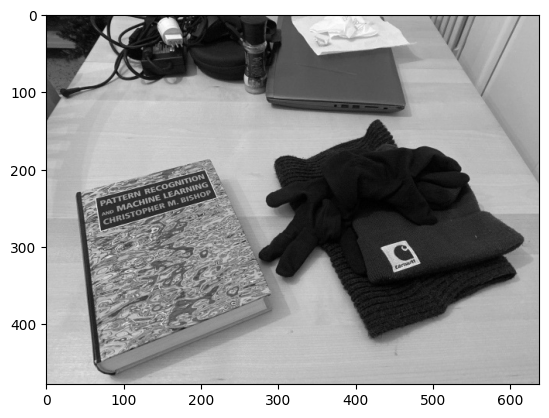

Found query object in scene3.jpg: True


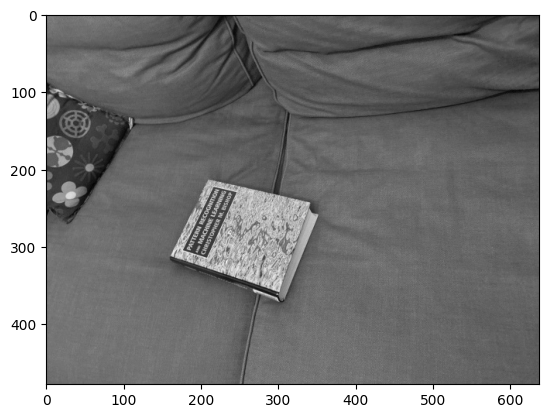

Found query object in scene4.jpg: False
Found query object in scene5.jpg: False


In [ ]:
MIN_MATCH_COUNT = 10

def detect_object(img_model, img_scene, min_match_count):
    sift = cv2.SIFT_create()
    kp_model = sift.detect(img_model) #find the keypoints
    kp_scene = sift.detect(img_scene)
    kp_model, des_model = sift.compute(img_model, kp_model) #define the keypoints' descriptors
    kp_scene, des_scene = sift.compute(img_scene, kp_scene)

    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(des_model, des_scene, k=2)

    # Store the good matches according to Lowe's ratio test
    good = []
    for m, n in matches:
        if m.distance < 0.5 * n.distance: #T = 0.5
            good.append(m)

    return len(good)

img_model = cv2.imread("bishop.jpg", cv2.IMREAD_GRAYSCALE)
imgs_scene = ["scene1.jpg", "scene2.jpg", "scene3.jpg", "scene4.jpg", "scene5.jpg"]

# Iterating among all images and looking for the query object
for path in imgs_scene:
    img_train = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    found = detect_object(img_model, img_train, 50)
    print(f"Found query object in {path}: {found > 0}")
    if found > 0:
        plt.imshow(img_train, "gray", vmin=0, vmax=255)
        plt.show()

## Exercise 2: Mosaicing (a.k.a. Panorama Stitching)
Given two images (`panorama_left_rgb.jpg` and `panorama_right_rgb.jpg` or `panorama_left.jpg` and `panorama_right.jpg`), stitch them together in a single image.

Tips:
* Find correspondences between the two images;
* Find a homography;
* Warp one image and restore values for the other image.

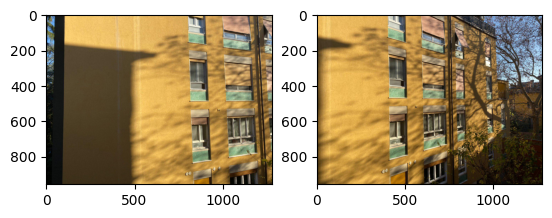

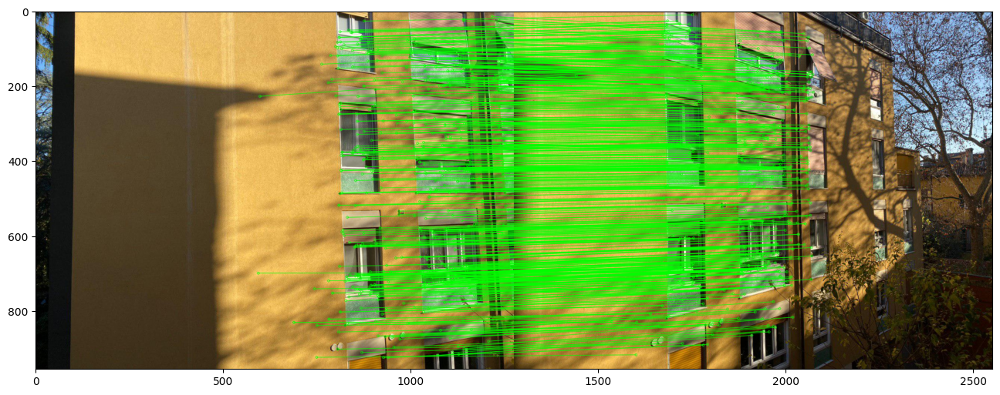

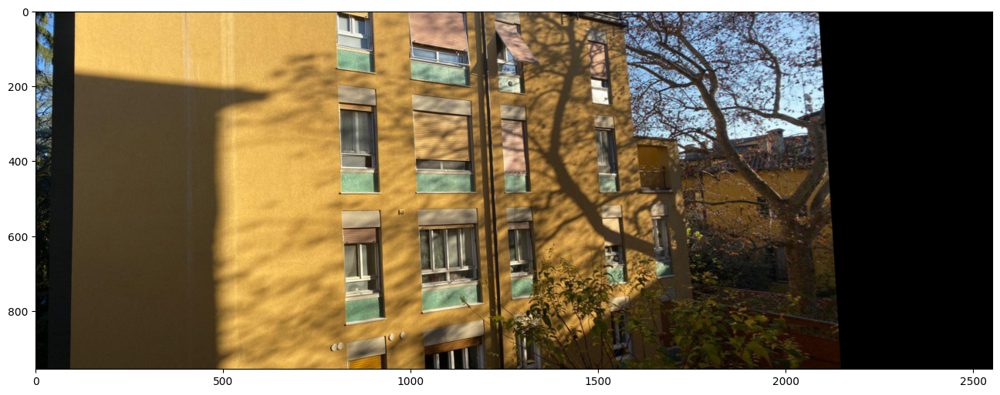

In [ ]:
# Loading images
img1 = cv2.imread("panorama_left_rgb.jpg")[:, :, ::-1]
img2 = cv2.imread("panorama_right_rgb.jpg")[:, :, ::-1]
plt.subplot(1, 2, 1)
plt.imshow(img1)
plt.subplot(1, 2, 2)
plt.imshow(img2)
plt.show()

# Getting correspondences
sift = cv2.SIFT_create()
kp1 = sift.detect(img1)
kp2 = sift.detect(img2)
kp1, des1 = sift.compute(img1, kp1)
kp2, des2 = sift.compute(img2, kp2)

FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(des1, des2, k=2)

# Store the good matches according to Lowe's ratio test
good = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good.append(m)

# Finding a homography
src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)
# Using RANSAC to estimate a robust homography.
# It returns the homography M and a mask for the discarded points.
M, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)

# Mask of discarded point used in visualization
matches_mask = mask.ravel().tolist()

# Drawing matches
draw_params = dict(
    matchColor=(0, 255, 0),
    singlePointColor=None,
    matchesMask=matches_mask,
    flags=2
)

img3 = cv2.drawMatches(img1, kp1, img2, kp2, good, None, **draw_params)
plt.figure(figsize=(16, 8))
plt.imshow(img3)
plt.show()

# Warping right image with the homography. Result images have a bigger shape to contain both images.
# Use the cv2.warpPerspective(image_to_warp, homography_matrix, output_shape) function
# to warp the second image to match the first one.
result = cv2.warpPerspective(img2, M, (img1.shape[1] + img2.shape[1], img1.shape[0]))

# Restoring left image values into the result image
result[:img1.shape[0], :img1.shape[1]] = img1

# Displaying the result
plt.figure(figsize=(16, 8))
plt.imshow(result)
plt.show()

## Exercise 3: Augmented Reality
Given a scene image (`scene1.jpg`, `scene2.jpg`, or `scene3.jpg`), a model image (`bishop.jpg`), and a third image (`box.png`), implement an an algorithm that projects the latter onto the surface of the model object in the scene image.

Moreover, restore the values of the original scene image instead of the black pixels obtained with warping.

Scene Image


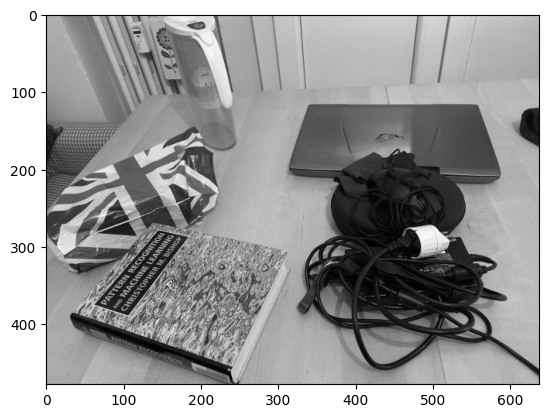


Model Image


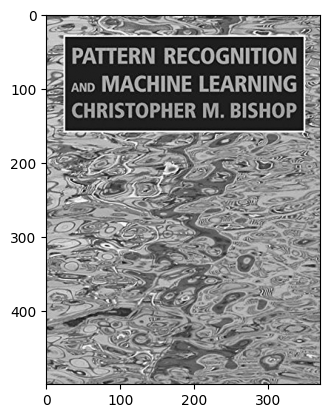


Image to Project


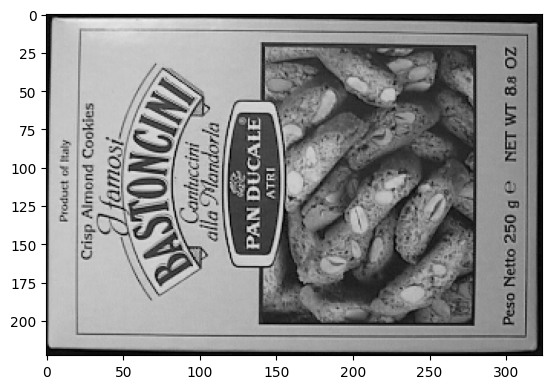


Mask


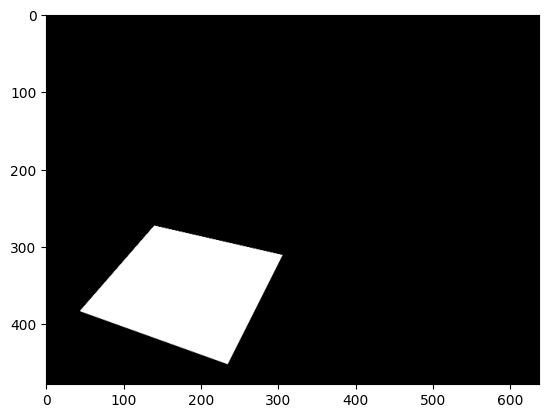


Result Image


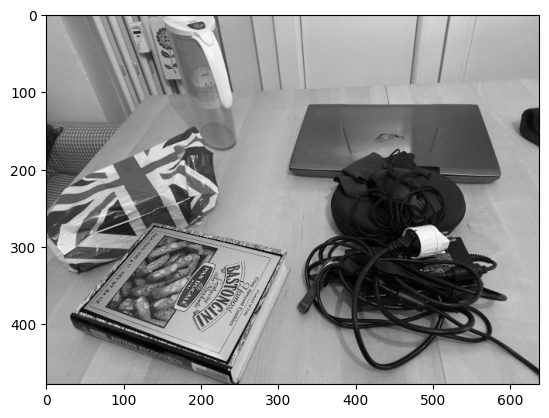

In [ ]:
# Loading images
img_scene = cv2.imread("scene1.jpg", cv2.IMREAD_GRAYSCALE)
img_model = cv2.imread("bishop.jpg", cv2.IMREAD_GRAYSCALE)
img_ar = cv2.imread("box.png", cv2.IMREAD_GRAYSCALE)

print("Scene Image")
plt.imshow(img_scene, cmap="gray", vmin=0, vmax=255)
plt.show()
print("\nModel Image")
plt.imshow(img_model, cmap="gray", vmin=0, vmax=255)
plt.show()
print("\nImage to Project")
plt.imshow(img_ar, cmap="gray", vmin=0, vmax=255)
plt.show()

# For a better visualization in the scene image
img_ar = cv2.rotate(img_ar, cv2.ROTATE_90_COUNTERCLOCKWISE)  # rotate by 270 degrees

# Implementing the object detection pipeline
sift = cv2.SIFT_create()
kp_model = sift.detect(img_model)
kp_scene = sift.detect(img_scene)
kp_model, des_model = sift.compute(img_model, kp_model)
kp_scene, des_scene = sift.compute(img_scene, kp_scene)

FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks = 50)
flann = cv2.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(des_model, des_scene, k=2)
good = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good.append(m)

# Checking if we found the object
MIN_MATCH_COUNT = 10

if len(good) > MIN_MATCH_COUNT:
    src_pts = np.float32([kp_model[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp_scene[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

    # Getting the coordinates of the corners of the model object in the scene image
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    h, w = img_model.shape
    pts = np.float32([[0,0], [0,h-1], [w-1,h-1], [w-1,0]]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts, M)

    h_t, w_t = img_scene.shape
    h, w = img_ar.shape

    # Getting the homography to project img_ar on the surface of the query object
    pts_ar = np.float32([[0,0], [0,h-1], [w-1,h-1], [w-1,0]]).reshape(-1,1,2)
    M = cv2.getPerspectiveTransform(pts_ar, dst)

    # Warping img_ar
    warped = cv2.warpPerspective(img_ar, M, (w_t, h_t))

    # Warping a white mask to understand where are the black pixels
    white = np.ones([h, w], dtype=np.uint8) * 255
    warp_mask = cv2.warpPerspective(white, M, (w_t, h_t))
    print("\nMask")
    plt.imshow(warp_mask, "gray", vmin=0, vmax=255)
    plt.show()

    # # Restoring previous values of the scene image where the mask is black
    warped[warp_mask==0] = img_scene[warp_mask==0]

    # # Displaying the result
    print("\nResult Image")
    plt.imshow(warped, cmap="gray", vmin=0, vmax=255)
    plt.show()

else:
    print(f"\nNot enough matches are found - {len(good)}/{MIN_MATCH_COUNT}")